In [1]:
%config Completer.use_jedi = False
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc
rc('font', family='Arial Unicode MS')
%matplotlib inline
plt.rcParams['axes.unicode_minus'] = False
import folium
import json
from glob import glob
import missingno as msno

In [2]:
df = pd.read_csv('./datas/industry_merged.csv', encoding='utf-8')
df.head()

,산업분류,년도,회사수 (개),매출액 (백만원),당기순이익 (백만원),영업이익 (백만원),경상이익 (백만원),매출액증가율 (%),매출액이익률 (%),납입자본이익률 (%),매출액경상이익률 (%),자기자본이익률 (%),총자본경상이익률 (%),시장규모,시총
0,건설업,2005,54,40785394,2029565,3096864,2885231,3.670,4.955,36.710,6.780,13.245,7.915,150470135,26444487
1,건설업,2006,57,44745972,2755247,3657870,3652228,12.410,5.850,46.305,7.950,14.790,8.855,153315180,33138291
2,건설업,2007,57,47834524,2802313,3566035,3718370,5.065,4.870,38.700,6.545,11.275,6.450,166693235,53907176
3,건설업,2008,56,53570702,3195413,3672975,4577360,16.480,4.120,37.405,6.090,9.690,5.475,180679909,22653768
4,건설업,2009,55,61989084,1812152,3385664,2769115,18.770,2.270,24.915,3.400,5.765,3.150,188031835,31828104


In [4]:
df.columns.unique()

Index(['산업분류', '년도', '회사수 (개)', '매출액 (백만원)', '당기순이익 (백만원)', '영업이익 (백만원)',
       '경상이익 (백만원)', '매출액증가율 (%)', '매출액이익률 (%)', '납입자본이익률 (%)', '매출액경상이익률 (%)',
       '자기자본이익률 (%)', '총자본경상이익률 (%)', '시장규모', '시총'],
      dtype='object')

In [5]:
df['산업분류'].unique()

array(['건설업', '광업', '기계', '기타제조업', '농업, 임업 및 어업', '비금속광물', '서비스업', '섬유의복',
       '운수장비', '운수창고업', '유통업', '음식료품', '의료·정밀기기', '의약품', '전기가스', '전기전자',
       '종이·목재', '철강금속', '통신업', '화학', '제조업'], dtype=object)

In [13]:
df[df['산업분류'] =='전기전자'].head()

,산업분류,년도,회사수 (개),매출액 (백만원),당기순이익 (백만원),영업이익 (백만원),경상이익 (백만원),매출액증가율 (%),매출액이익률 (%),납입자본이익률 (%),매출액경상이익률 (%),자기자본이익률 (%),총자본경상이익률 (%),시장규모,시총
210,전기전자,2005,318,139669118,16563572,18376493,19588701,12.836667,0.410000,25.041667,1.868333,-0.881667,1.866667,102760372,193683017
211,전기전자,2006,342,139108840,9770007,11060239,10723539,6.865000,-4.051667,-5.403333,-3.393333,-9.760000,-3.890000,106575734,170062155
212,전기전자,2007,350,142517552,9220646,9146482,10473102,8.668333,-2.563333,2.293333,-1.820000,-4.841667,-1.781667,108678144,178873248
213,전기전자,2008,361,152065131,7641123,8998390,9692186,6.720000,-7.830000,-44.146667,-6.988333,-16.221667,-6.778333,123843348,116721643
214,전기전자,2009,350,169398673,3270895,6556552,4293565,2.480000,0.388333,13.281667,1.090000,1.355000,1.275000,140067824,228509681


In [10]:
len(df[df['산업분류'] =='전기전자'])

14

In [14]:
df_elec = df[df['산업분류'] =='전기전자']

In [15]:
df_elec.head()

,산업분류,년도,회사수 (개),매출액 (백만원),당기순이익 (백만원),영업이익 (백만원),경상이익 (백만원),매출액증가율 (%),매출액이익률 (%),납입자본이익률 (%),매출액경상이익률 (%),자기자본이익률 (%),총자본경상이익률 (%),시장규모,시총
210,전기전자,2005,318,139669118,16563572,18376493,19588701,12.836667,0.410000,25.041667,1.868333,-0.881667,1.866667,102760372,193683017
211,전기전자,2006,342,139108840,9770007,11060239,10723539,6.865000,-4.051667,-5.403333,-3.393333,-9.760000,-3.890000,106575734,170062155
212,전기전자,2007,350,142517552,9220646,9146482,10473102,8.668333,-2.563333,2.293333,-1.820000,-4.841667,-1.781667,108678144,178873248
213,전기전자,2008,361,152065131,7641123,8998390,9692186,6.720000,-7.830000,-44.146667,-6.988333,-16.221667,-6.778333,123843348,116721643
214,전기전자,2009,350,169398673,3270895,6556552,4293565,2.480000,0.388333,13.281667,1.090000,1.355000,1.275000,140067824,228509681


<AxesSubplot:xlabel='년도', ylabel='시장규모'>

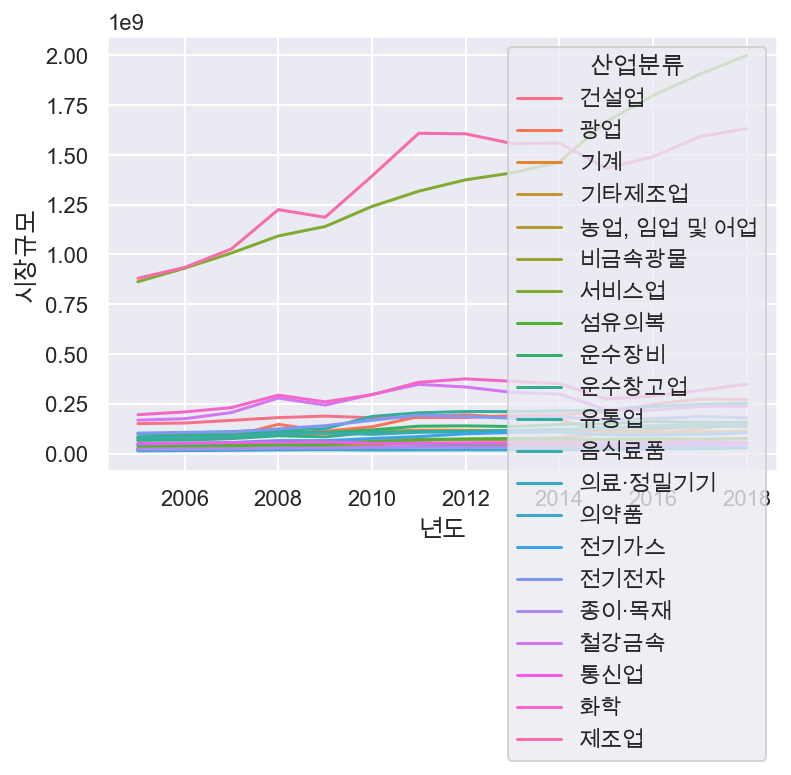

In [21]:
sns.lineplot(x="년도", y="시장규모",
             hue="산업분류", #style="event",
             data=df)

<AxesSubplot:xlabel='년도', ylabel='시장규모'>

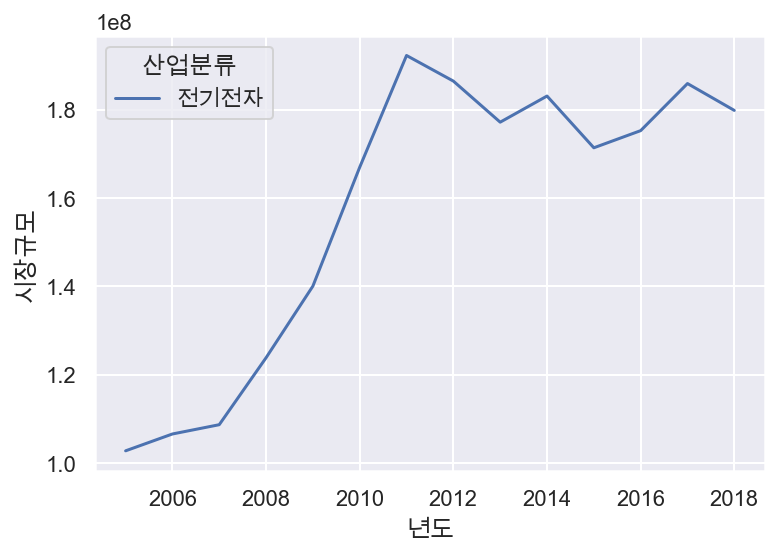

In [36]:
sns.lineplot(x="년도", y="시장규모",
             hue="산업분류", #style="event",
             data=df_elec)

In [39]:
sns.pairplot(df, hue="산업분류", height=5)

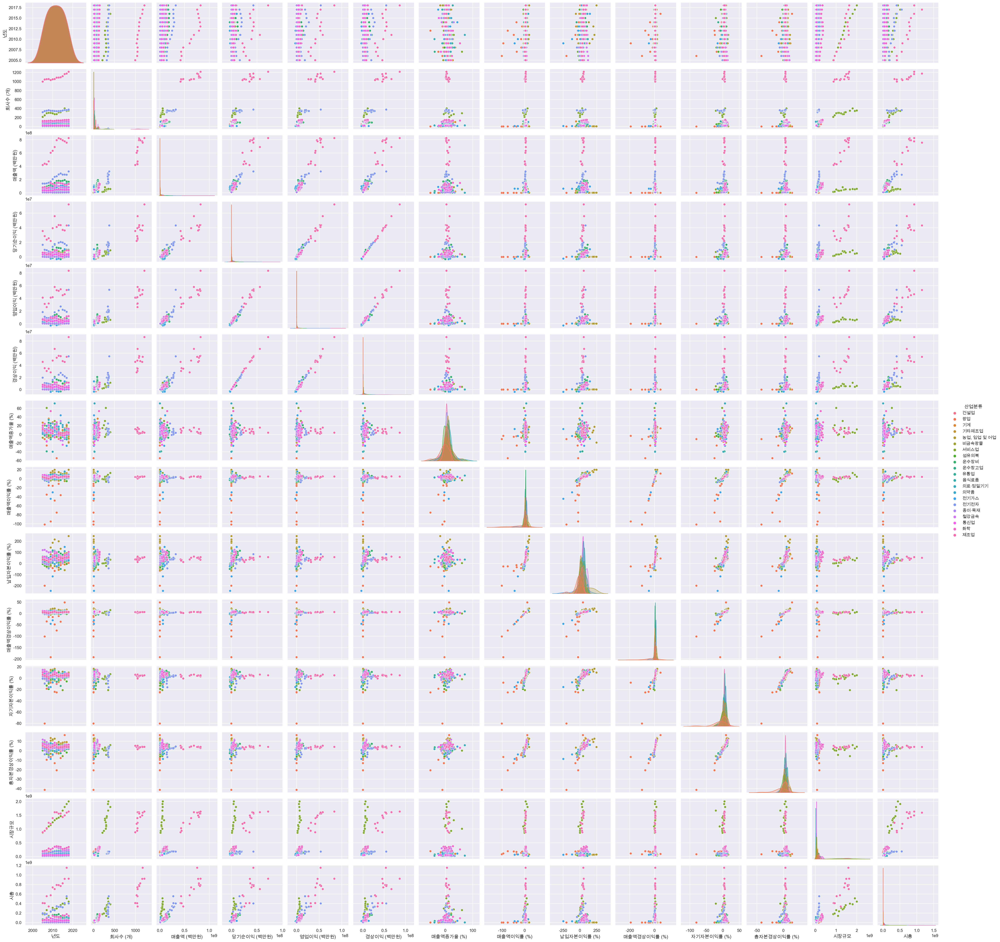

In [40]:
sns.pairplot(df, hue="산업분류")

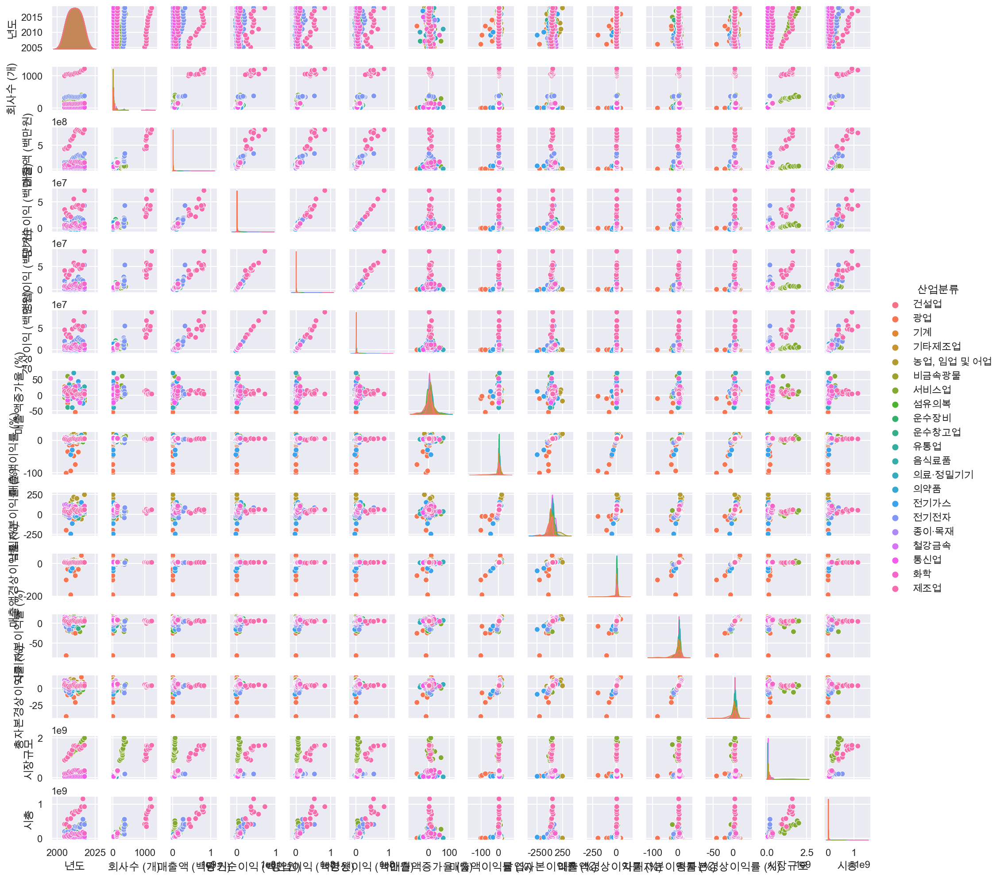

In [41]:
sns.pairplot(df, hue="산업분류", height=1)

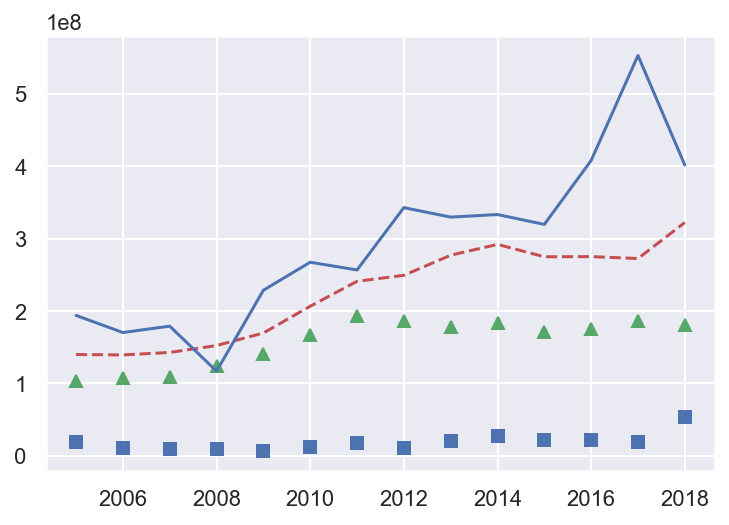

In [46]:
plt.plot(df_elec['년도'], df_elec['매출액 (백만원)'], 'r--', 
        df_elec['년도'], df_elec['영업이익 (백만원)'], 'bs', 
        df_elec['년도'], df_elec['시장규모'], 'g^',
        df_elec['년도'], df_elec['시총'], 'b' )